# Keras Regression Code Along Project 

Let's now apply our knowledge to a more realistic data set. Here we will also focus on feature engineering and cleaning our data!

## The Data

We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [8]:
# Libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams["figure.figsize"] = (12,8)
plt.rcParams["figure.dpi"] = 300

In [2]:
df = pd.read_csv("data/kc_house_data.csv")

In [4]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null int64
view             21597 non-null int64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null int64
yr_built         21597 non-null int64
yr_renovated     21597 non-null int64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(5), int64(15), object(1)
memory usage: 3.5+ MB


In [3]:
df.isna().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [7]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
id,21597.0,4.580474e+09,2.876736e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21597.0,5.402966e+05,3.673681e+05,7.800000e+04,3.220000e+05,4.500000e+05,6.450000e+05,7.700000e+06
bedrooms,21597.0,3.373200e+00,9.262989e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
bathrooms,21597.0,2.115826e+00,7.689843e-01,5.000000e-01,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
sqft_living,21597.0,2.080322e+03,9.181061e+02,3.700000e+02,1.430000e+03,1.910000e+03,2.550000e+03,1.354000e+04
sqft_lot,21597.0,1.509941e+04,4.141264e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068500e+04,1.651359e+06
floors,21597.0,1.494096e+00,5.396828e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
waterfront,21597.0,7.547345e-03,8.654900e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
view,21597.0,2.342918e-01,7.663898e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21597.0,3.409825e+00,6.505456e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


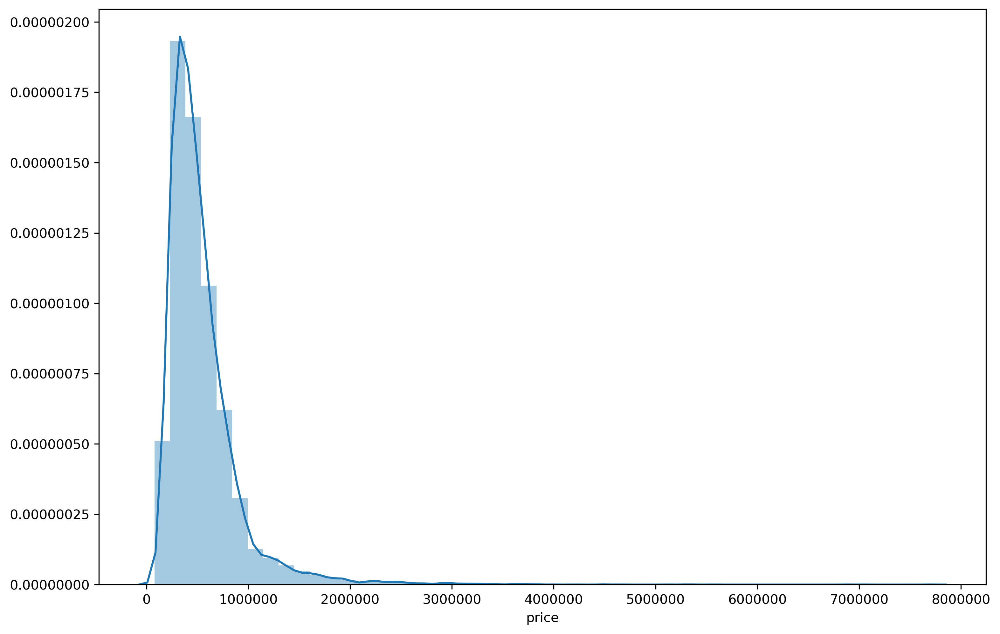

In [10]:
sns.distplot(df["price"]);

It seems as most of the prices range from 0 to 1.5 Million. Those values above 3 Million could maybe be dropped as they seem to represent very rare cases. So if we are building a model to predict house prices up to around 2 Million having these points to train may be unwise.

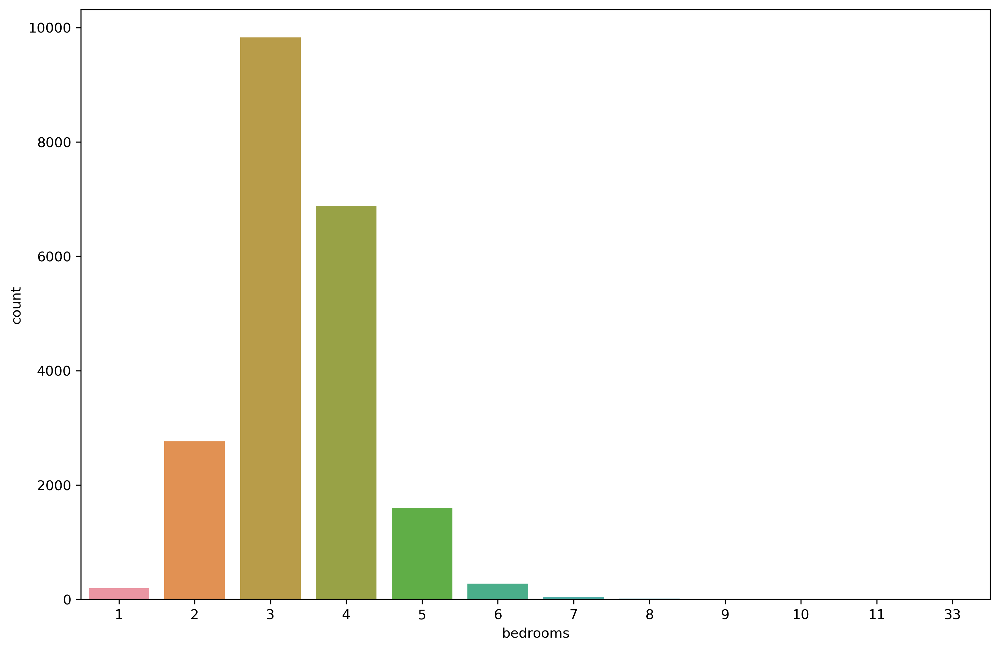

In [12]:
sns.countplot(df["bedrooms"]);

In [15]:
df.corr()["price"].sort_values()

zipcode         -0.053402
id              -0.016772
long             0.022036
condition        0.036056
yr_built         0.053953
sqft_lot15       0.082845
sqft_lot         0.089876
yr_renovated     0.126424
floors           0.256804
waterfront       0.266398
lat              0.306692
bedrooms         0.308787
sqft_basement    0.323799
view             0.397370
bathrooms        0.525906
sqft_living15    0.585241
sqft_above       0.605368
grade            0.667951
sqft_living      0.701917
price            1.000000
Name: price, dtype: float64

We should perform a multivariate analysis between the target variable and those that are highly correlated or have the higher correlation values.

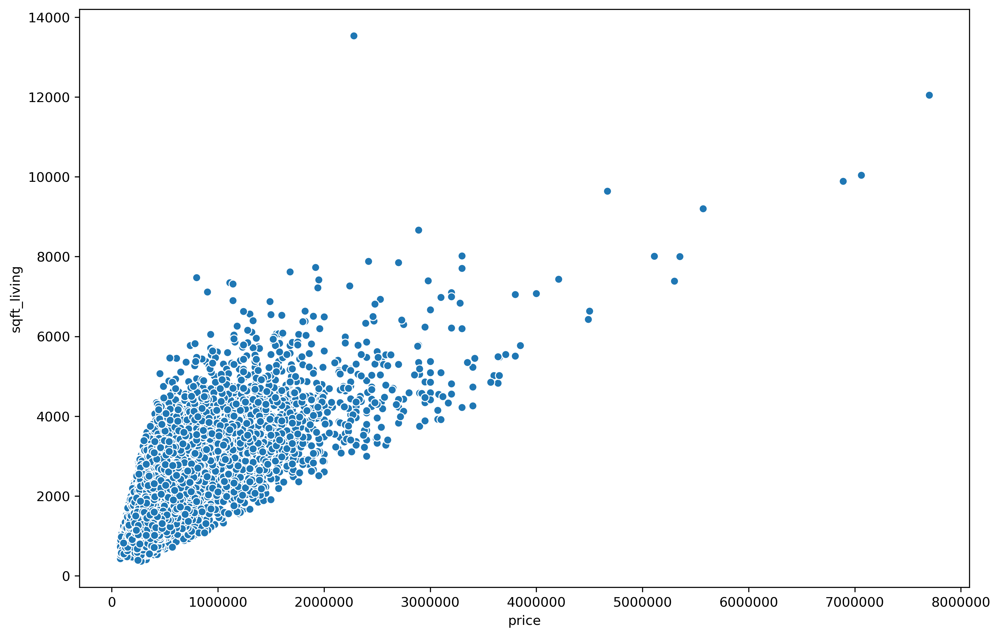

In [17]:
sns.scatterplot(x="price", y="sqft_living", data=df);

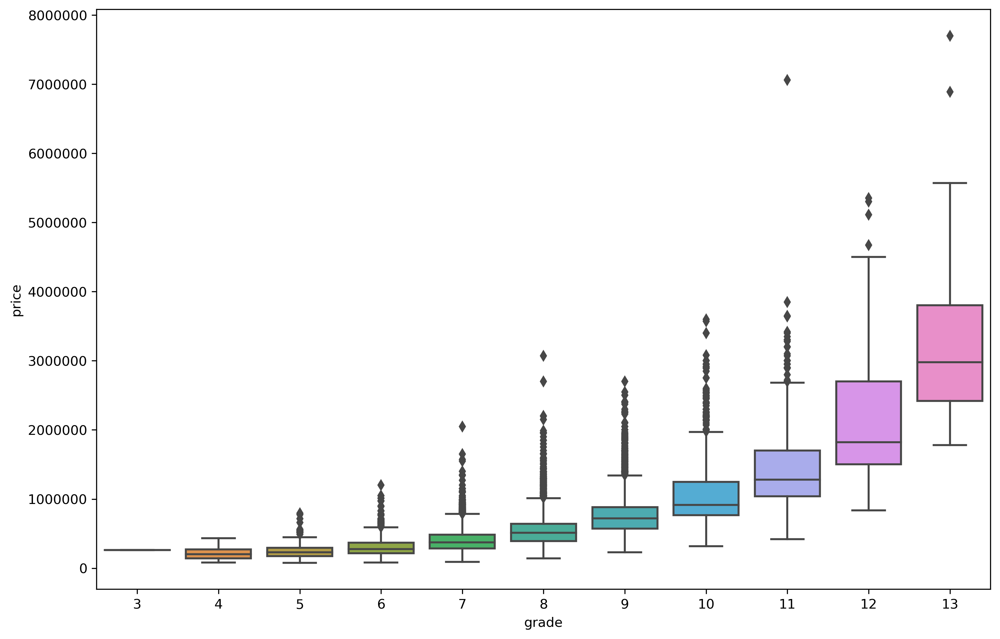

In [19]:
sns.boxplot(x="grade", y="price", data=df);

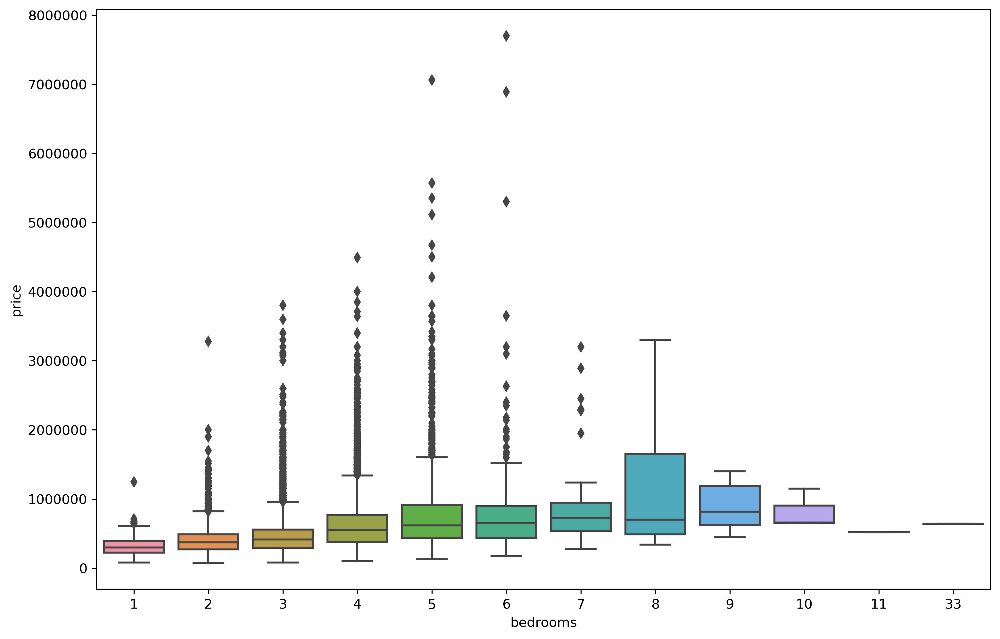

In [20]:
sns.boxplot(x="bedrooms", y="price", data=df);

Let's look into the latitude and longitude

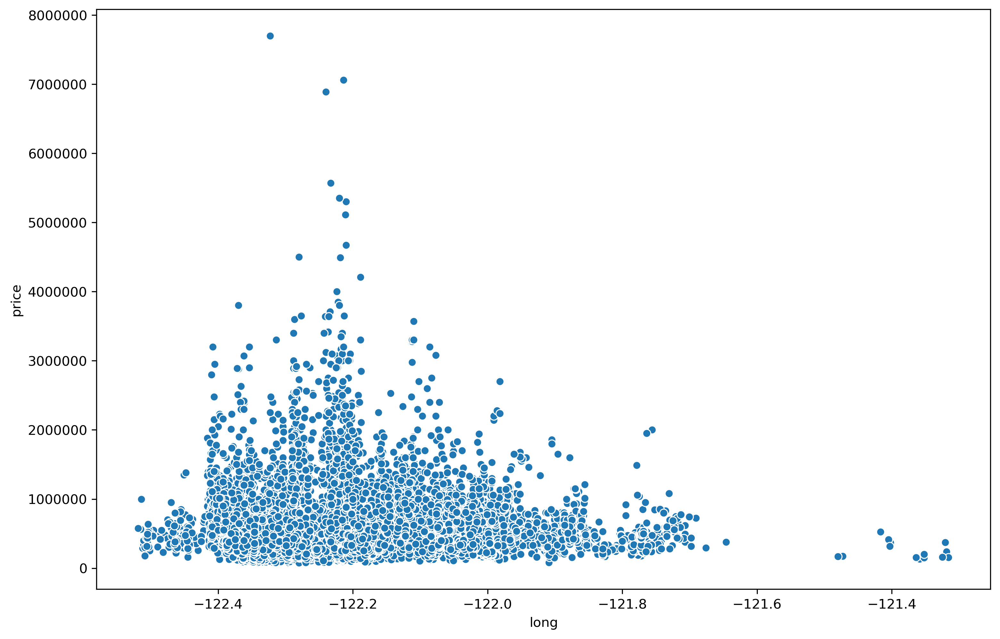

In [23]:
sns.scatterplot(x="long", y="price", data=df);

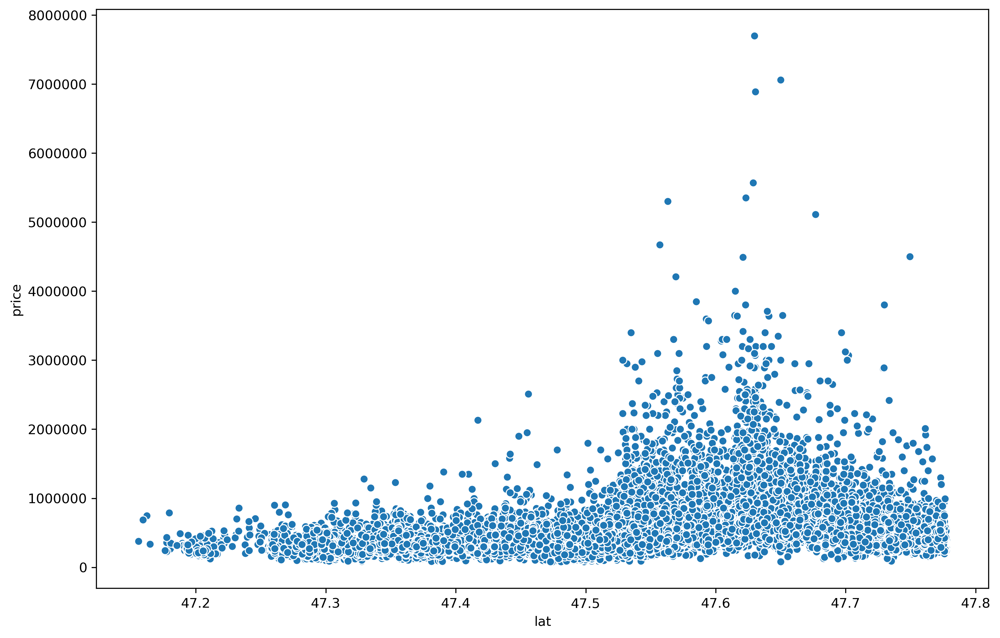

In [24]:
sns.scatterplot(x="lat", y="price", data=df);

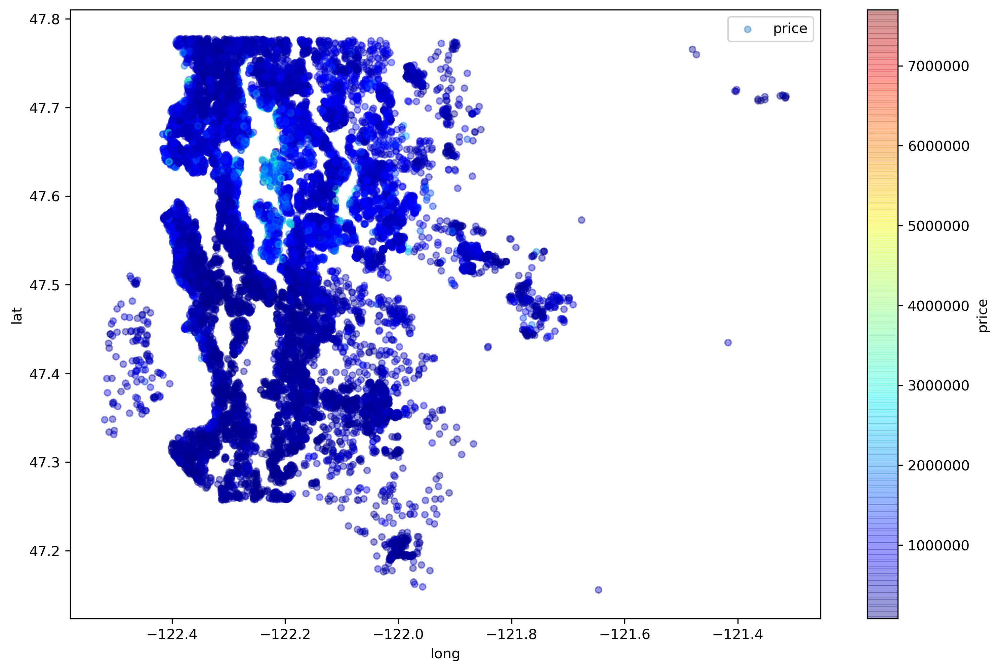

In [28]:
# King County region 
df.plot(kind="scatter", x="long", y="lat", alpha=0.4,
            label="price", c="price", 
            cmap=plt.get_cmap("jet"), 
            colorbar=True,
            sharex=False);

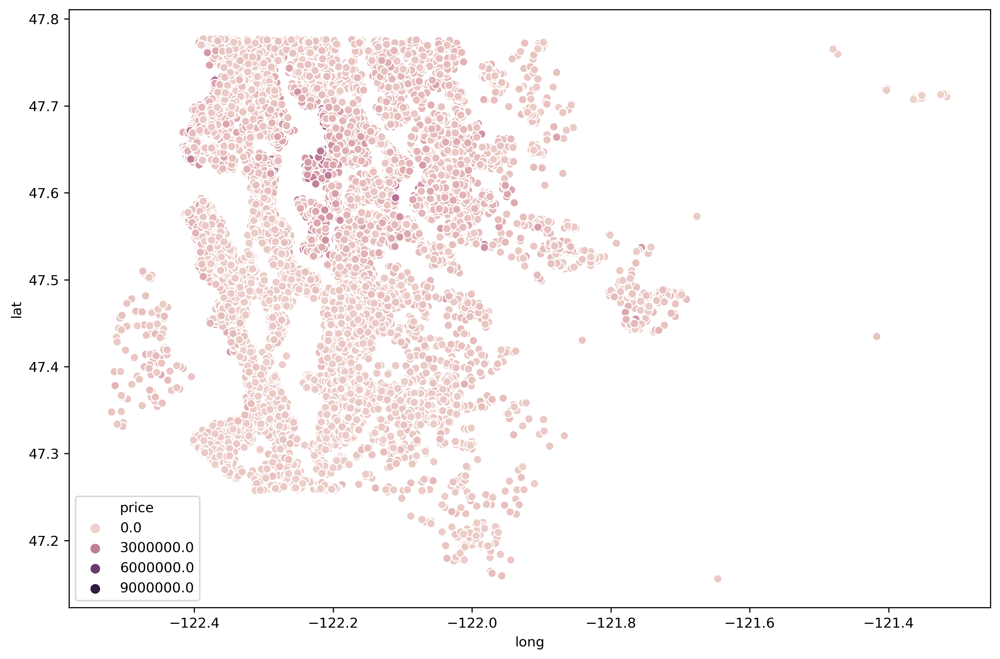

In [30]:
sns.scatterplot(x="long", y="lat", data=df,
               hue="price");

In [31]:
df.sort_values("price", ascending=False).head(20)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,6762700020,10/13/2014,7700000.0,6,8.00,12050,27600,2.5,0,3,...,13,8570,3480,1910,1987,98102,47.6298,-122.323,3940,8800
3910,9808700762,6/11/2014,7060000.0,5,4.50,10040,37325,2.0,1,2,...,11,7680,2360,1940,2001,98004,47.6500,-122.214,3930,25449
9245,9208900037,9/19/2014,6890000.0,6,7.75,9890,31374,2.0,0,4,...,13,8860,1030,2001,0,98039,47.6305,-122.240,4540,42730
4407,2470100110,8/4/2014,5570000.0,5,5.75,9200,35069,2.0,0,0,...,13,6200,3000,2001,0,98039,47.6289,-122.233,3560,24345
1446,8907500070,4/13/2015,5350000.0,5,5.00,8000,23985,2.0,0,4,...,12,6720,1280,2009,0,98004,47.6232,-122.220,4600,21750
1313,7558700030,4/13/2015,5300000.0,6,6.00,7390,24829,2.0,1,4,...,12,5000,2390,1991,0,98040,47.5631,-122.210,4320,24619
1162,1247600105,10/20/2014,5110000.0,5,5.25,8010,45517,2.0,1,4,...,12,5990,2020,1999,0,98033,47.6767,-122.211,3430,26788
8085,1924059029,6/17/2014,4670000.0,5,6.75,9640,13068,1.0,1,4,...,12,4820,4820,1983,2009,98040,47.5570,-122.210,3270,10454
2624,7738500731,8/15/2014,4500000.0,5,5.50,6640,40014,2.0,1,4,...,12,6350,290,2004,0,98155,47.7493,-122.280,3030,23408
8629,3835500195,6/18/2014,4490000.0,4,3.00,6430,27517,2.0,0,0,...,12,6430,0,2001,0,98004,47.6208,-122.219,3720,14592


In [32]:
# Number of houses
len(df)

21597

In [33]:
non_top_1_perc = df.sort_values("price", ascending=False).iloc[216:]

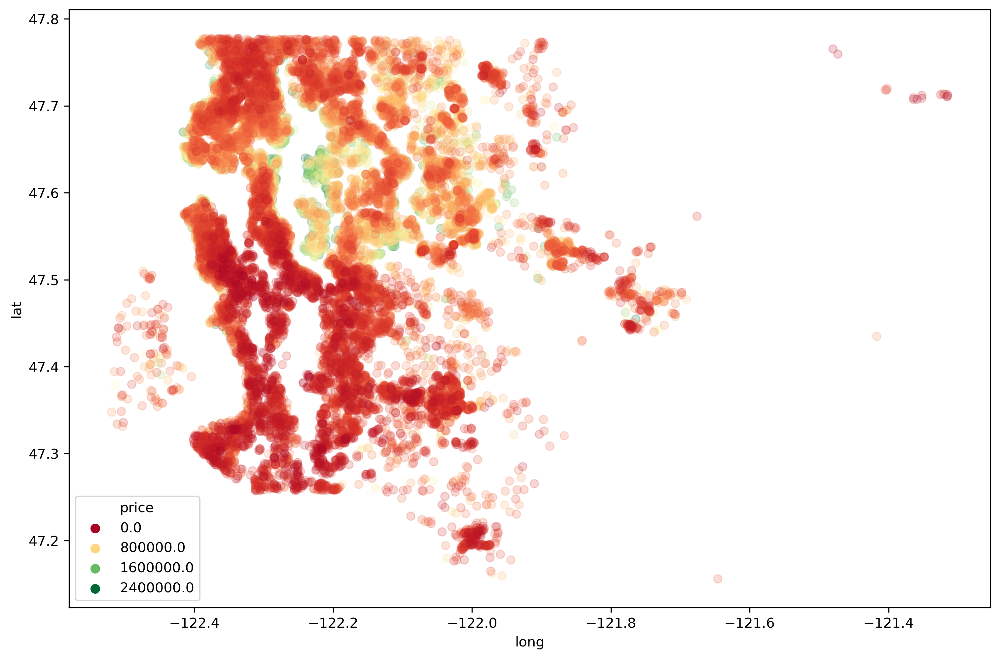

In [37]:
# King County Region - method 1
sns.scatterplot(x="long", y="lat", data=non_top_1_perc,
               hue="price", edgecolor=None, alpha=0.2, 
                palette="RdYlGn");

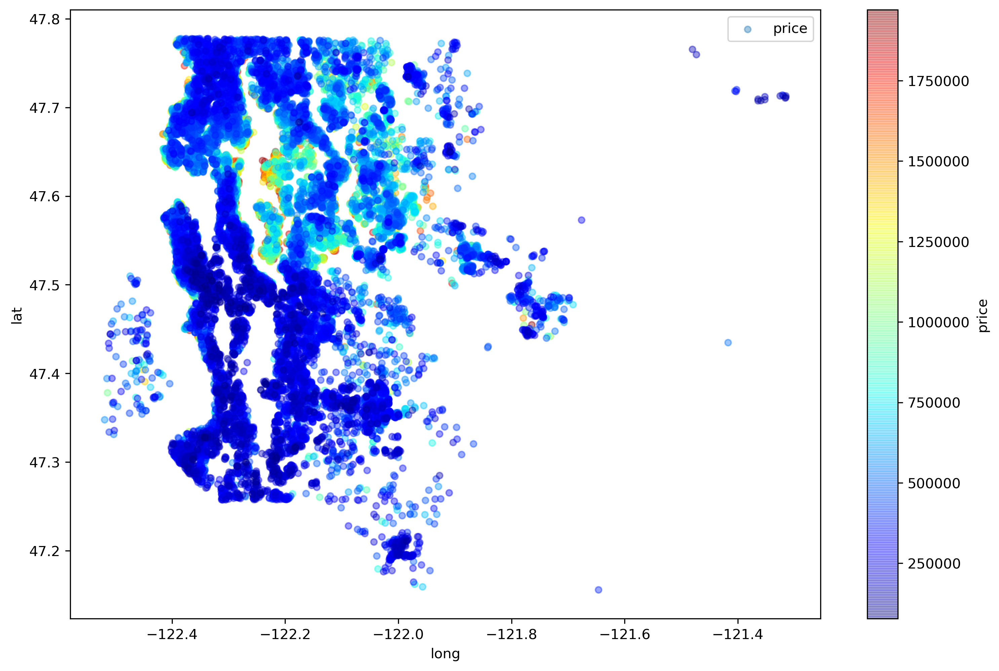

In [35]:
# King County region - method 2
non_top_1_perc.plot(kind="scatter", x="long", y="lat", alpha=0.4,
            label="price", c="price", 
            cmap=plt.get_cmap("jet"), 
            colorbar=True,
            sharex=False);

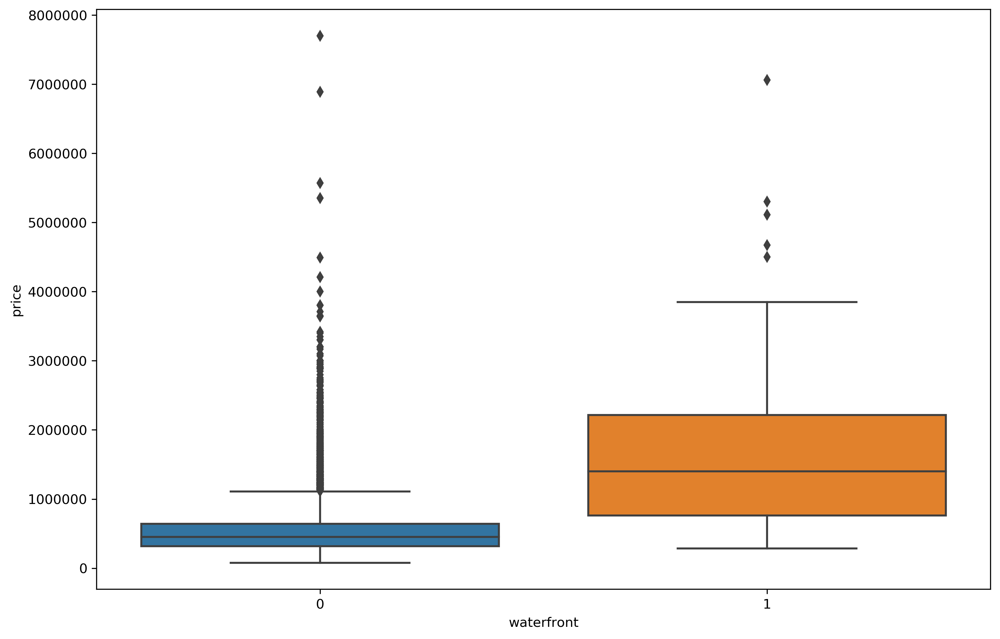

In [40]:
sns.boxplot(x="waterfront", y="price", data=df);

## Feature Engineering

In [41]:
df = df.drop("id", axis=1)

In [42]:
df["date"] = pd.to_datetime(df["date"])

In [43]:
df["year"] = df["date"].apply(lambda date : date.year)

In [44]:
df["month"] = df["date"].apply(lambda date : date.month)

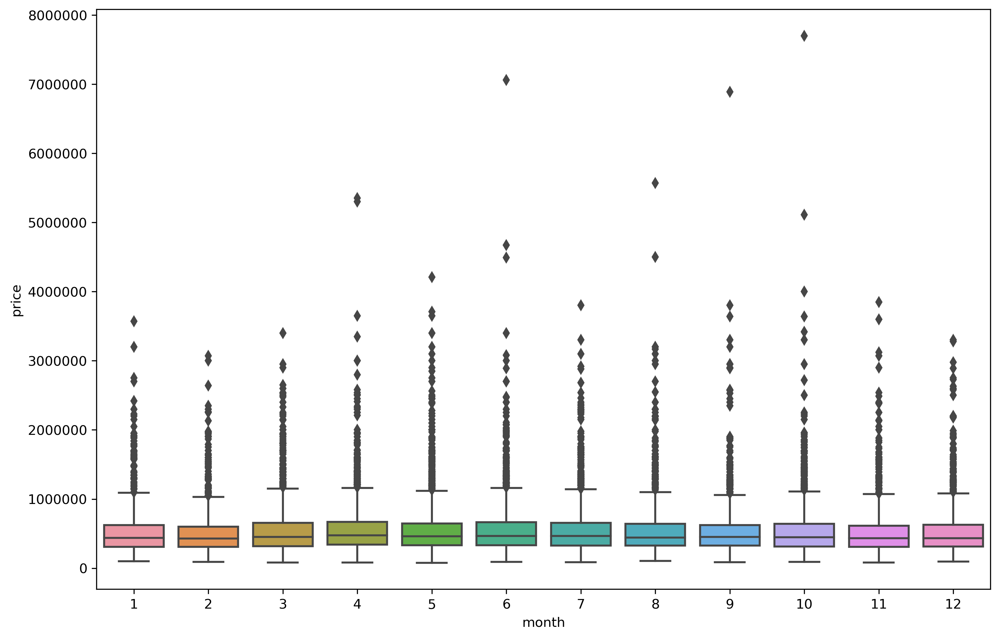

In [45]:
# Check what the feauture month may tell us

sns.boxplot(x="month", y="price", data=df);

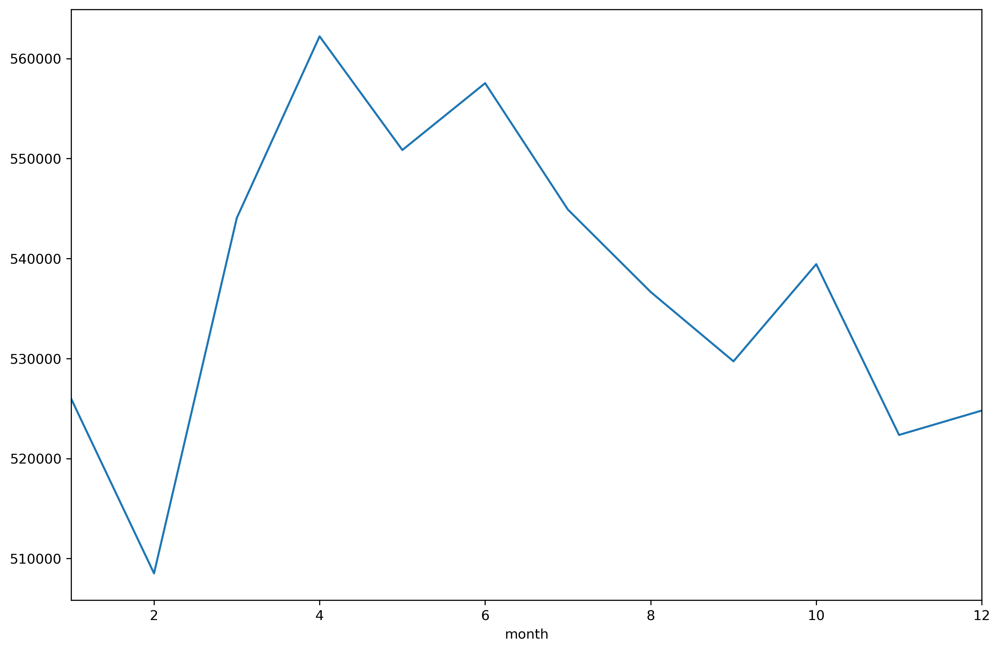

In [48]:
df.groupby("month").mean()["price"].plot();

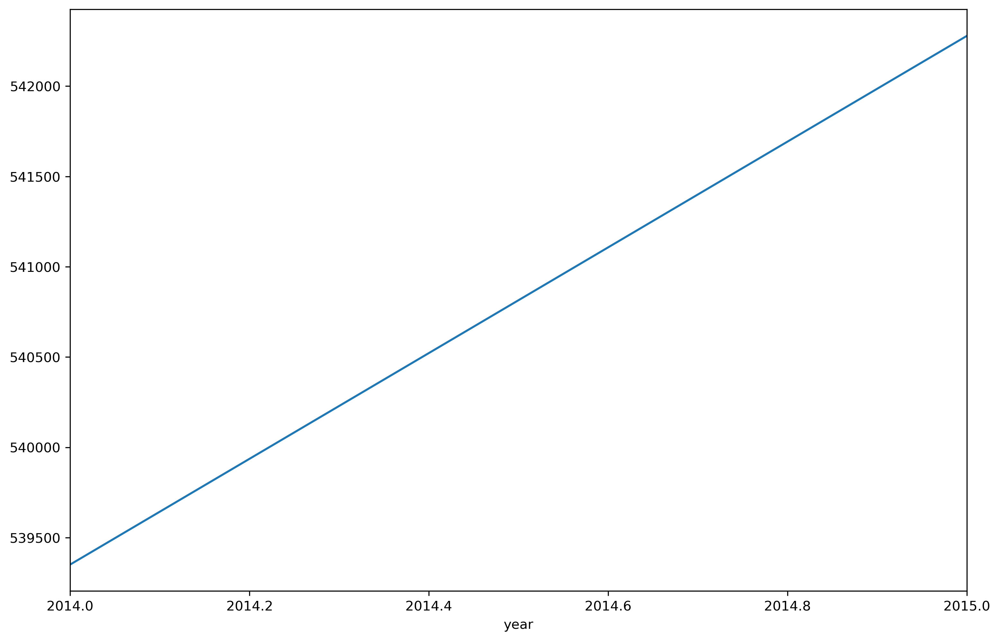

In [49]:
df.groupby("year").mean()["price"].plot();

The behaviour of our target variable "price" in relation to month is curious as we can see that from Spring to the end of the summer the prices are higher. In relation to the year we can observe an expected behaviour as naturally, yearly the prices rise.

In [50]:
df = df.drop("date", axis=1)

In [51]:
df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'year', 'month'],
      dtype='object')

In [52]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,...,0,1955,0,98178,47.5112,-122.257,1340,5650,2014,10
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,...,400,1951,1991,98125,47.7210,-122.319,1690,7639,2014,12
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,...,0,1933,0,98028,47.7379,-122.233,2720,8062,2015,2
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,...,910,1965,0,98136,47.5208,-122.393,1360,5000,2014,12
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,...,0,1987,0,98074,47.6168,-122.045,1800,7503,2015,2


We can see that the zipcode variable is numerical but ordinal. The model may assume it as continuous. A higher zipcode may not a higher price or vice-versa. We should treat it as a categorical variable. Domain knowledge could be of help here.

In [53]:
df["zipcode"].value_counts()

98103    602
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

With 70 different zipcodes, using onehotenconding or creating dummy variables would mean having 69 new columns, which is a great increase in the number of dimensions. Alternatively we can drop it. Another approach would be, with the right domain expertise, figure out classes of areas with zipcodes that have more expensive houses or less expensive. Or even North, South, East and West.

In [54]:
df = df.drop("zipcode", axis=1)

Another variable to consider is the year renovated. We can see that we either have 0 or years. 

In [55]:
df["yr_renovated"].value_counts()

0       20683
2014       91
2013       37
2003       36
2000       35
        ...  
1934        1
1959        1
1951        1
1948        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

The value 0 is not a year but just means that it wasn't renovated. The most recent the renovation the more probable the higher price. As the higher the value the higher the price we can keep this as it is. The best approach would be to recategorize it.

In [56]:
df["sqft_basement"].value_counts()

0       13110
600       221
700       218
500       214
800       206
        ...  
792         1
2590        1
935         1
2390        1
248         1
Name: sqft_basement, Length: 306, dtype: int64

In this case, we have the 0 as there is no basement, and basement with space. We can also keep this as it makes sense as with more space bigger the value. With no basement, less value.

## Model

In [57]:
X = df.drop("price", axis=1).values
y = df["price"].values

In [58]:
from sklearn.model_selection import train_test_split

In [59]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.3, 
                                                    random_state=101)

In [60]:
from sklearn.preprocessing import MinMaxScaler

In [61]:
scaler = MinMaxScaler()

In [62]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [63]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

Calculate number of neurons

In [64]:
X_train.shape

(15117, 19)

In [67]:
model = Sequential()

model.add(Dense(19, activation="relu"))
model.add(Dense(19, activation="relu"))
model.add(Dense(19, activation="relu"))
model.add(Dense(19, activation="relu"))

model.add(Dense(1))

model.compile(optimizer="adam",
             loss="mse")

In [68]:
model.fit(x=X_train, y=y_train,
         validation_data=(X_test, y_test),
         batch_size=128, epochs=400)

Train on 15117 samples, validate on 6480 samples
Epoch 1/400
15117/15117 [==============================] - 1s 41us/sample - loss: 430243070146.0025 - val_loss: 418928129021.4716
Epoch 2/400
15117/15117 [==============================] - 0s 10us/sample - loss: 429183156331.2975 - val_loss: 415115221563.4173
Epoch 3/400
15117/15117 [==============================] - 0s 10us/sample - loss: 413271192555.8817 - val_loss: 378211155199.3679
Epoch 4/400
15117/15117 [==============================] - 0s 10us/sample - loss: 333832181589.7059 - val_loss: 250302531113.7185
Epoch 5/400
15117/15117 [==============================] - 0s 11us/sample - loss: 180422356087.8291 - val_loss: 112951150364.4444
Epoch 6/400
15117/15117 [==============================] - 0s 10us/sample - loss: 103149007398.3060 - val_loss: 95108481044.2272
Epoch 7/400
15117/15117 [==============================] - 0s 10us/sample - loss: 97435954827.8457 - val_loss: 93512312776.3753
Epoch 8/400
15117/15117 [===================

15117/15117 [==============================] - 0s 11us/sample - loss: 33147661277.4196 - val_loss: 31696218516.5432
Epoch 128/400
15117/15117 [==============================] - 0s 10us/sample - loss: 33100166800.7229 - val_loss: 31649633348.2667
Epoch 129/400
15117/15117 [==============================] - 0s 9us/sample - loss: 33060025167.1353 - val_loss: 31722018300.2074
Epoch 130/400
15117/15117 [==============================] - 0s 10us/sample - loss: 33028402004.6898 - val_loss: 31600183513.4420
Epoch 131/400
15117/15117 [==============================] - 0s 10us/sample - loss: 32998261904.2826 - val_loss: 31536615874.0543
Epoch 132/400
15117/15117 [==============================] - 0s 9us/sample - loss: 32984002401.2214 - val_loss: 31570107161.9160
Epoch 133/400
15117/15117 [==============================] - 0s 10us/sample - loss: 32918912479.7904 - val_loss: 31591930422.3605
Epoch 134/400
15117/15117 [==============================] - 0s 10us/sample - loss: 32913741608.4567 - val

15117/15117 [==============================] - 0s 9us/sample - loss: 30920855956.5332 - val_loss: 28991816569.9951
Epoch 254/400
15117/15117 [==============================] - 0s 9us/sample - loss: 30897716070.1663 - val_loss: 28978983119.3284
Epoch 255/400
15117/15117 [==============================] - 0s 9us/sample - loss: 30931077966.8643 - val_loss: 29031062601.3235
Epoch 256/400
15117/15117 [==============================] - 0s 10us/sample - loss: 30936840978.7127 - val_loss: 29032969516.8790
Epoch 257/400
15117/15117 [==============================] - 0s 9us/sample - loss: 30936550668.9888 - val_loss: 29008545078.9926
Epoch 258/400
15117/15117 [==============================] - 0s 10us/sample - loss: 30851782677.2021 - val_loss: 29128050404.8198
Epoch 259/400
15117/15117 [==============================] - 0s 9us/sample - loss: 30896826795.9029 - val_loss: 28890483684.1876
Epoch 260/400
15117/15117 [==============================] - 0s 9us/sample - loss: 30884051298.2036 - val_los

15117/15117 [==============================] - 0s 10us/sample - loss: 30021728951.4015 - val_loss: 28032307741.0765
Epoch 380/400
15117/15117 [==============================] - 0s 11us/sample - loss: 30054625664.9568 - val_loss: 27887634163.9901
Epoch 381/400
15117/15117 [==============================] - 0s 11us/sample - loss: 30072186630.9940 - val_loss: 27868120551.9802
Epoch 382/400
15117/15117 [==============================] - 0s 10us/sample - loss: 29981085216.1418 - val_loss: 27919986612.1481
Epoch 383/400
15117/15117 [==============================] - 0s 11us/sample - loss: 29994645530.0792 - val_loss: 27802423725.8272
Epoch 384/400
15117/15117 [==============================] - 0s 11us/sample - loss: 30013141146.7143 - val_loss: 27769364252.4444
Epoch 385/400
15117/15117 [==============================] - 0s 11us/sample - loss: 29974067730.2555 - val_loss: 27742521986.2123
Epoch 386/400
15117/15117 [==============================] - 0s 10us/sample - loss: 30003905321.0663 - v

In [71]:
losses = pd.DataFrame(model.history.history)

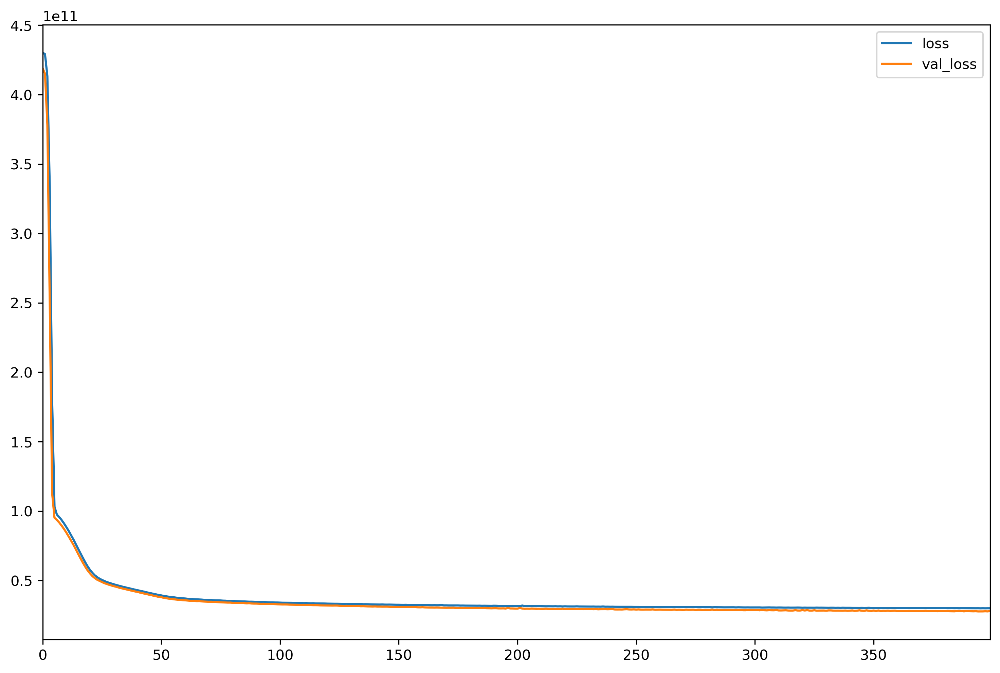

In [73]:
losses.plot();

We can directly compare the training loss to validation loss. This signal is exactly the signal we want as the train and validation loss both decrease and then there is no increase in the validation set. As the validation loss doesn't increase further on we technically should continue to train. If it increases it means we're overfitting, in that case we should stop at that point.

## Evaluation

In [74]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score

In [75]:
predictions = model.predict(X_test)

In [76]:
predictions

array([[396452.03],
       [589529.25],
       [548159.75],
       ...,
       [374690.75],
       [532890.25],
       [646288.6 ]], dtype=float32)

In [77]:
mean_absolute_error(y_test, predictions)

103318.49293258102

In [78]:
mean_squared_error(y_test, predictions)

27891594669.4471

In [79]:
mean_squared_error(y_test, predictions)**0.5

167007.76829072085

In [80]:
df["price"].describe()

count    2.159700e+04
mean     5.402966e+05
std      3.673681e+05
min      7.800000e+04
25%      3.220000e+05
50%      4.500000e+05
75%      6.450000e+05
max      7.700000e+06
Name: price, dtype: float64

In [81]:
5.402966e+05

540296.6

With a mean price of 540k an error of 103k is not good.

In [82]:
explained_variance_score(y_test, predictions)

0.790198523070187

A variance score of .8 is not bad. We know that we can continue training and with these results we should.

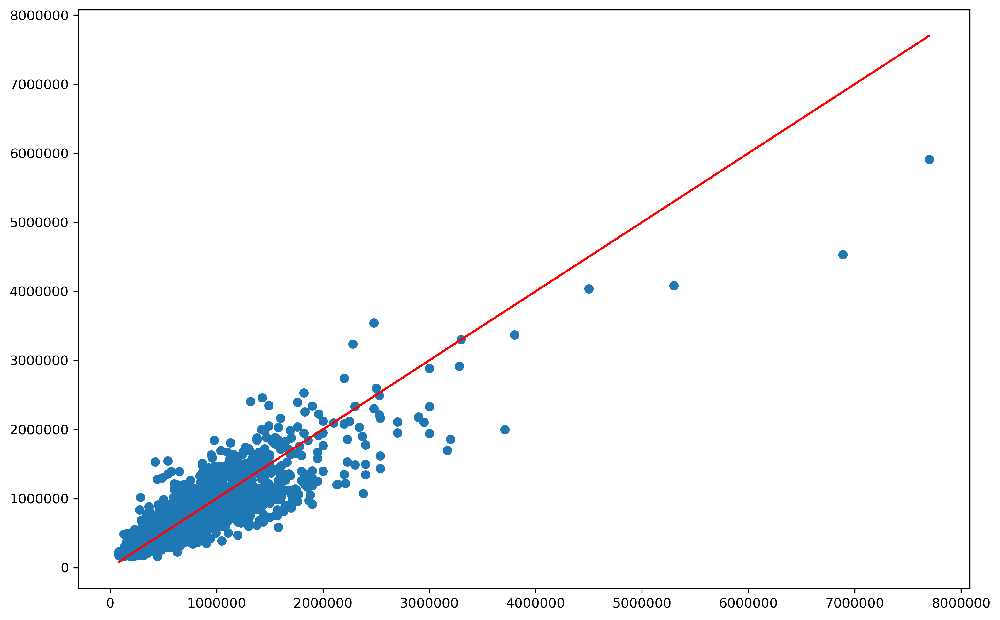

In [85]:
plt.scatter(y_test, predictions)
plt.plot(y_test, y_test, "r");

With a perfect model our points would always be close to the red line. We also see we are being punished by outliers. Maybe we should remove these. This depends on the context.

Let's predict a new house price

In [87]:
# We grab the first observation and predict the house price
single_house = df.drop("price", axis=1).iloc[0]

In [90]:
single_house = scaler.transform(single_house.values.reshape(-1,19))

In [91]:
model.predict(single_house)

array([[279878.]], dtype=float32)

In [92]:
df.head(1)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,year,month
0,221900.0,3,1.0,1180,5650,1.0,0,0,3,7,1180,0,1955,0,47.5112,-122.257,1340,5650,2014,10


We predicted a price of 279878 when the true price is 221900.

Next steps:
* Remove outliers
* Retrain the model with more epochs
* Compare results